# MACHINE LEARNING PROJECT Adam Mounir gp. DAI

### DATASET IMPORTATION

In [492]:
#TO AVOID ERRORS EVERY CELL
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

In [494]:
import pandas as pd
import matplotlib.pyplot as plt

In [496]:
df = pd.read_csv(r"./diabetes.csv")

In [498]:
df.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1


### Overview of the variable types & distribution in the dataset

**Types**

In [502]:
df.dtypes

Pregnancies                   int64
Glucose                       int64
BloodPressure                 int64
SkinThickness                 int64
Insulin                       int64
BMI                         float64
DiabetesPedigreeFunction    float64
Age                           int64
Outcome                       int64
dtype: object

In [504]:
print(df['Outcome'].unique())

[1 0]


The target variable only has 2 categories (the patient has diabete or not) 

**Distribution before '0' values treatment**

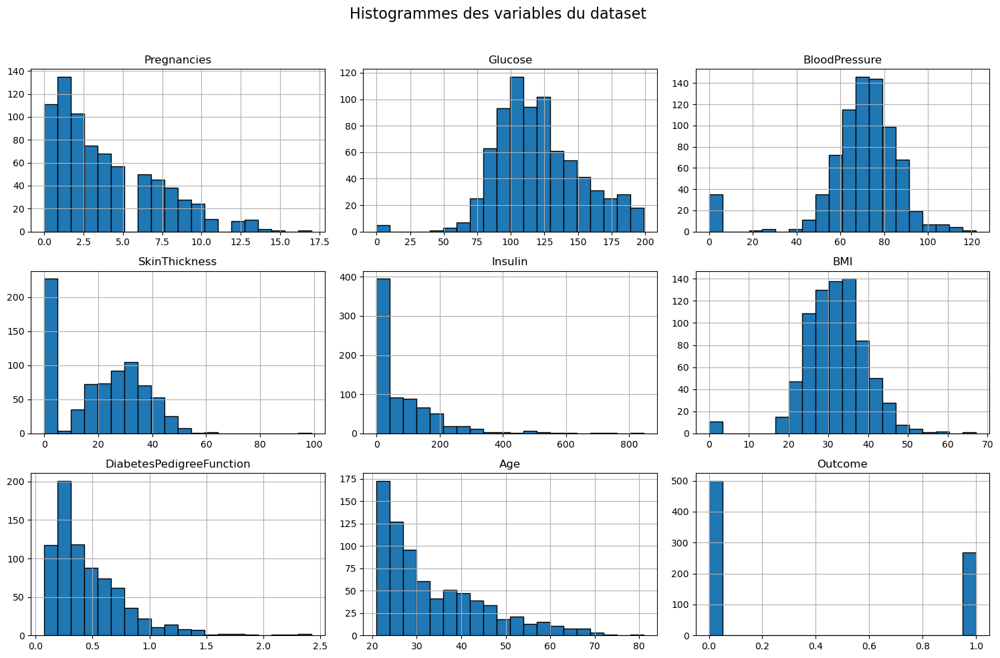

In [508]:
df.hist(bins=20, figsize=(15, 10), edgecolor='black')
plt.suptitle('Histogrammes des variables du dataset', fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.96])  
plt.show()

As we can see there is a lot of values that are equal to zero and medically it has no sense, then to handle this issue it is a good idea to replace theses zero value by the median of the column they are contained in.

In [510]:
col_to_check = ['Glucose','BloodPressure','SkinThickness','Insulin','BMI','DiabetesPedigreeFunction','Age']
df[col_to_check]=df[col_to_check].replace(0,df[col_to_check].median())

In [511]:
df.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,30.5,33.6,0.627,50,1
1,1,85,66,29,30.5,26.6,0.351,31,0
2,8,183,64,23,30.5,23.3,0.672,32,1
3,1,89,66,23,94.0,28.1,0.167,21,0
4,0,137,40,35,168.0,43.1,2.288,33,1


**Distribution after '0' values treatment**

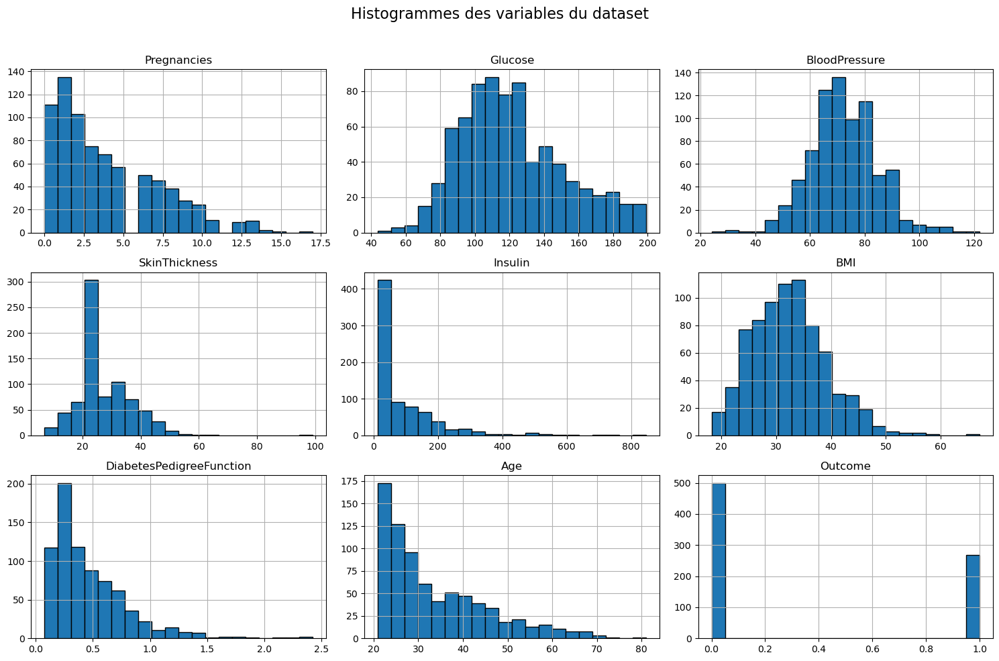

In [513]:
df.hist(bins=20, figsize=(15, 10), edgecolor='black')
plt.suptitle('Histogrammes des variables du dataset', fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.96])  
plt.show()

### Standardization

In [515]:
dfc = df.copy()   #working on a dataset copy so is doesn't modify the original one

In [516]:
X = dfc.drop(columns = ['Outcome'])
y = dfc['Outcome']

In [517]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

In [518]:
df_standardized = pd.DataFrame(X_scaled, columns=X.columns)
df_standardized.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age
0,0.639947,0.866045,-0.031990,0.831114,-0.608201,0.167240,0.468492,1.425995
1,-0.844885,-1.205066,-0.528319,0.180566,-0.608201,-0.851551,-0.365061,-0.190672
2,1.233880,2.016662,-0.693761,-0.469981,-0.608201,-1.331838,0.604397,-0.105584
3,-0.844885,-1.073567,-0.528319,-0.469981,-0.006185,-0.633239,-0.920763,-1.041549
4,-1.141852,0.504422,-2.679076,0.831114,0.695378,1.549885,5.484909,-0.020496


### First overview of the dataset (ydata-profiling)

In [520]:
from    ydata_profiling    import    ProfileReport
profile    =    ProfileReport(df_standardized,    title='Diabetes Report')
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

This report is giving a lot of informations about the features repartition. However despite the fact we have a correlation matrix showing the correlation between the variables themselves, **this wouldn't make sense** refer to it to see wheter a feature is correlated to the target variable.

### Classification repartition for each feature (Visualization)

Indeed we **only have quantitative features** in the dataset, and the **target variable is qualitative** (0 or 1 wheter a patient has diabete or not). We then can't considere this type of correlation to considere a feature as correlated or not to the target variable and then to choose it for a machine learning model.

Then to face this problem we will firstly make a **distribution visualization** for the positive and the negative diabete patients of each unique variable. This will help us to have an **first insight of the general statistic distribution** of each variable.

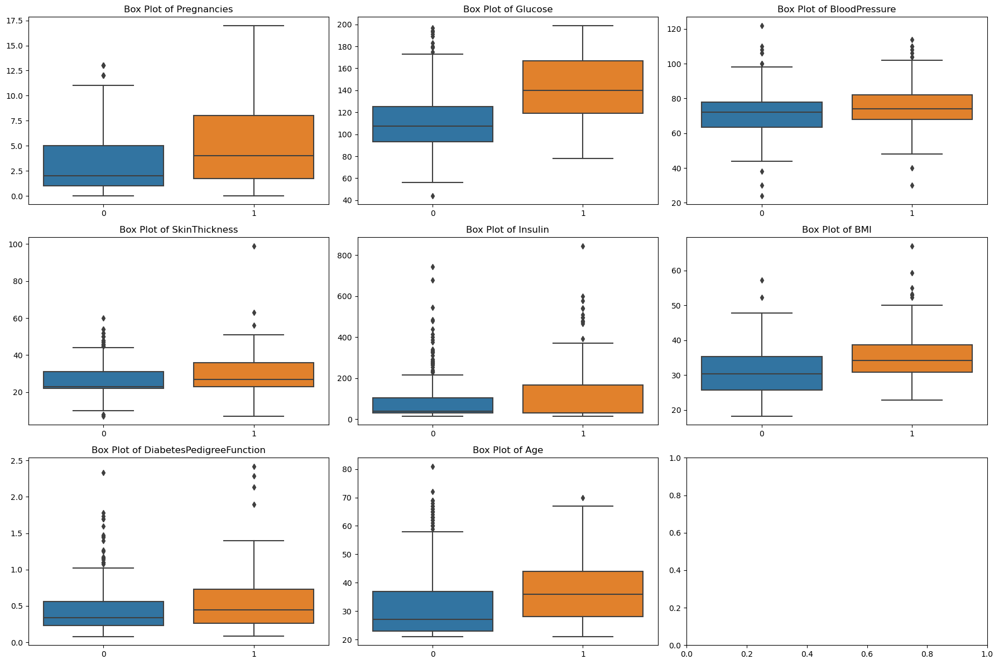

In [525]:
import seaborn as sns
plots_per_row = 3
num_features = len(df.columns) - 1 
num_rows = (num_features + plots_per_row - 1) // plots_per_row

fig, axes = plt.subplots(num_rows, plots_per_row, figsize=(plots_per_row * 6, num_rows * 4))

axes = axes.flatten()

for i, col in enumerate(df.columns.drop('Outcome')):
    sns.boxplot(x='Outcome', y=col, data=df, ax=axes[i])
    axes[i].set_title(f'Box Plot of {col}', fontsize=12)
    axes[i].set_xlabel('')
    axes[i].set_ylabel('')

plt.tight_layout()
plt.show()

Seeing the boxplots we need to consider some parameters to say whether a variable has correlation with the target variable or not:

-The difference of medians between the two classifications

-The Inter Quartile Range (the higher the better)

-The Mustachs and the Outliers values

Generaly, the bigger the distributions and the more difference there is between the two classifications, the higher the chances are that this variable is interesting for the ML model.

### Classification repartition for each feature (ANoVA test)

To confirm this hypothesis we can also make a **Analysis of Variance test (Anova test)**. The point is to compare the means for the two classifications for a variable and to see if the p_value is bigger than 0.05 or not. The p-value indicates **the probability that the differences linked to the means are due to chance.**

If **p_value < 0.05** then it is a good variable : the difference observed between the two categories have **less than 0.05% chance to be due to chance**.

In [529]:
import pandas as pd
from scipy.stats import f_oneway

numeric_columns = dfc.select_dtypes(include='number').columns #que les colonnes numériques

anova_results = {}
for column in numeric_columns:
    
    #séparation des groupes
    group_0 = df[df['Outcome'] == 1][column]
    group_1 = df[df['Outcome'] == 0][column]    
    
    f_stat, p_value = f_oneway(group_0, group_1) # test anova
    
    anova_results[column] = p_value


for var, p_val in anova_results.items():
    print(f"Variable: {var}, p-value: {p_val}") #affichage

Variable: Pregnancies, p-value: 5.065127298052554e-10
Variable: Glucose, p-value: 3.1287190418415387e-48
Variable: BloodPressure, p-value: 3.890835490647002e-06
Variable: SkinThickness, p-value: 1.3011814339567176e-07
Variable: Insulin, p-value: 3.6217221617816914e-05
Variable: BMI, p-value: 7.879147621567584e-19
Variable: DiabetesPedigreeFunction, p-value: 1.2546070101485626e-06
Variable: Age, p-value: 2.2099754606650332e-11
Variable: Outcome, p-value: 0.0


Among these values, there is no value > 0.05. Then we don't need to delete any of them

### Verification of the linearity between the variables (for dimensionnality reduction)

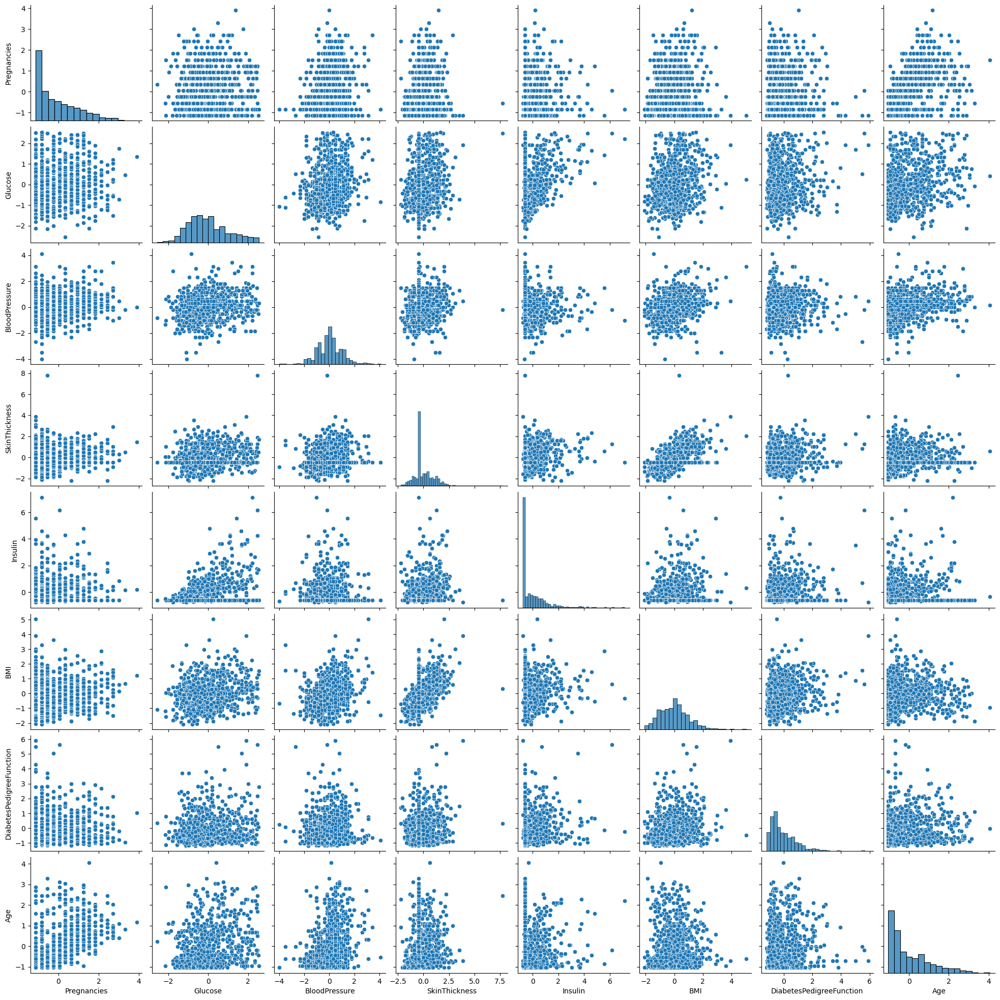

In [532]:
sns.pairplot(df_standardized)
plt.show()

### Dimensionnality reduction (only used with MLPClassifier)

Seeing these pairplots we deduct that the differents features are not linked together with linear relations. 

Then if we want to apply dimensionnailty reduction we shouldn't go with a PCA method because PCA is used to catch linear relations between variables. A method which is more adapted for this kind of dimensionnailty reduction is the Isomap method because it is able to catch non-liear relations between variables.

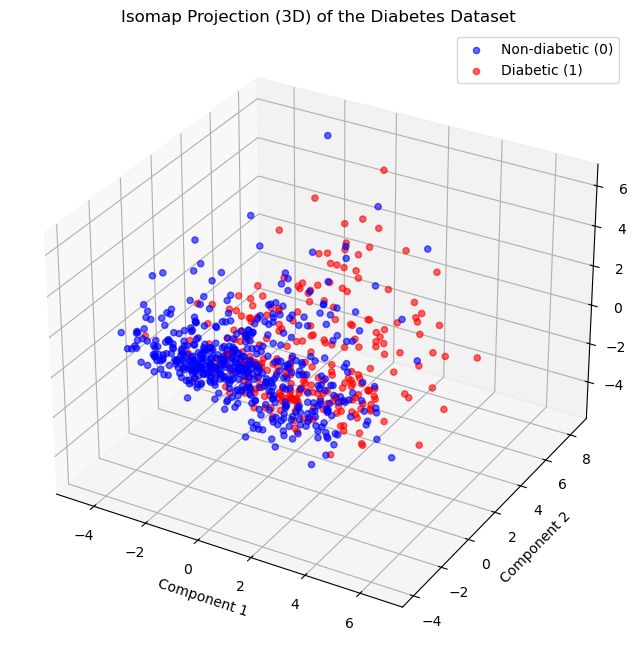

In [599]:
from sklearn.manifold import Isomap
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

X = df_standardized  # Features
y = df['Outcome']  # Target

# isomap avec 3 dimensions
isomap = Isomap(n_neighbors=9, n_components=3)
X_isomap = isomap.fit_transform(X)

# graphique 3D
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')


ax.scatter(X_isomap[y == 0, 0], X_isomap[y == 0, 1], X_isomap[y == 0, 2], 
           c='blue', label='Non-diabetic (0)', alpha=0.6)
ax.scatter(X_isomap[y == 1, 0], X_isomap[y == 1, 1], X_isomap[y == 1, 2], 
           c='red', label='Diabetic (1)', alpha=0.6)

# Ajouter des labels et un titre
ax.set_title('Isomap Projection (3D) of the Diabetes Dataset')
ax.set_xlabel('Component 1')
ax.set_ylabel('Component 2')
ax.set_zlabel('Component 3')
ax.legend()

plt.show()

#### MACHINE LEARNING MODELS

**Random Forest**

Train/Test split (with stratify parameter to keep the imbalance proportions for the splits)

In [541]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, stratify=y, random_state=42)

Here we will use the standardized dataset containing the orignal features and not the 2 Components from the Isomap. Indeed,as we have seen during the course, the Random Forest model is built from many decision trees. The decision tree is a model making decisions based on multiple parameters and the combination of many decision trees at the same time can help making good predictions since each tree makes decision on a subset of parameters. High dimensionnality is then not a problem for that model.

Accuracy for Random Forest: 0.7662337662337663
Precision for Random Forest: 0.6875
Recall for Random Forest: 0.6111111111111112
F1 Score for Random Forest: 0.6470588235294118


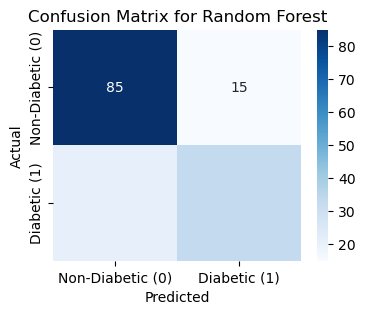

[[85 15]
 [21 33]]


In [543]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix

rf = RandomForestClassifier(n_estimators=100, criterion='entropy', random_state=42)  #model 
rf.fit(X_train, y_train)


y_pred_rf = rf.predict(X_test)                         #prediction


acc_rf = accuracy_score(y_test, y_pred_rf)             #metrics
precision = precision_score(y_test, y_pred_rf)
recall = recall_score(y_test, y_pred_rf)
f1 = f1_score(y_test, y_pred_rf)
conf_matrix = confusion_matrix(y_test, y_pred_rf)


print("Accuracy for Random Forest:", acc_rf)
print("Precision for Random Forest:", precision)
print("Recall for Random Forest:", recall)
print("F1 Score for Random Forest:", f1)


plt.figure(figsize=(4, 3))                                        #confusion matrix
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', 
            xticklabels=['Non-Diabetic (0)', 'Diabetic (1)'], 
            yticklabels=['Non-Diabetic (0)', 'Diabetic (1)'])
plt.title('Confusion Matrix for Random Forest')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()
print(conf_matrix)

Hyperparameter optimisation with GridSearch

In [545]:
#test parameters
param_grid = {
    'n_estimators': [25, 50, 75, 100, 125, 150, 175, 200, 400],
    'criterion': ['gini', 'entropy']
}                              


grid_search = GridSearchCV(estimator=RandomForestClassifier(random_state=42), 
                           param_grid=param_grid, 
                           cv=5, 
                           scoring='accuracy')

grid_search.fit(X_isomap, y)


print("Best parameters:", grid_search.best_params_)             #best parameters found
print("Best cross-validation score:", grid_search.best_score_)

Best parameters: {'criterion': 'gini', 'n_estimators': 50}
Best cross-validation score: 0.7122655122655122


**MLPClassifier**

Train/Test split (with stratify parameter to keep the imbalance proportions for the splits)

In [548]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X_isomap, y, test_size=0.2, stratify=y, random_state=42)

We will use the dimensionnality reduced dataset this time. In fact Neural Networks are models with a lot of parameters so it will help facilitate the prediction with simpler 2D space and avoid the overfitting with simpler research.

Accuracy for MLP Classifier: 0.7077922077922078
Precision for MLP Classifier: 0.5918367346938775
Recall for MLP Classifier: 0.5370370370370371
F1 Score for MLP Classifier: 0.5631067961165048


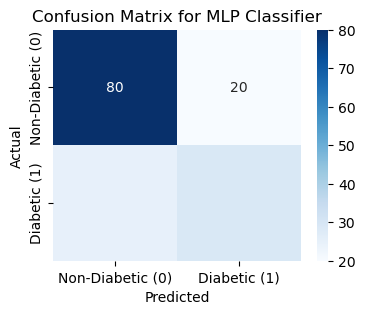

[[80 20]
 [25 29]]


In [550]:
from sklearn.neural_network import MLPClassifier


mlp = MLPClassifier(random_state=42)                            #model
mlp.fit(X_train, y_train)

y_pred_mlp = mlp.predict(X_test)                                #prediction

                   
acc_mlp = accuracy_score(y_test, y_pred_mlp)                    #metrics
precision = precision_score(y_test, y_pred_mlp)
recall = recall_score(y_test, y_pred_mlp)
f1 = f1_score(y_test, y_pred_mlp)
conf_matrix = confusion_matrix(y_test, y_pred_mlp)


print("Accuracy for MLP Classifier:", acc_mlp)
print("Precision for MLP Classifier:", precision)
print("Recall for MLP Classifier:", recall)
print("F1 Score for MLP Classifier:", f1)

                                                                 
plt.figure(figsize=(4, 3))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues',       #confusion matrix
            xticklabels=['Non-Diabetic (0)', 'Diabetic (1)'], 
            yticklabels=['Non-Diabetic (0)', 'Diabetic (1)'])
plt.title('Confusion Matrix for MLP Classifier')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()
print(conf_matrix)

Hyperparameter optimisation with GridSearch

In [555]:
param_grid = {
    'hidden_layer_sizes': [(50,), (100,), (50, 50), (100, 50)],  # hidden layers
    'activation': ['logistic', 'tanh', 'relu'],                  # activation function
    'solver': ['sgd', 'adam'],                                  
    'alpha': [0.0001, 0.001, 0.01],                              # regularisation rate
    'learning_rate': ['constant', 'adaptive']                    #learning rate
}


grid_search = GridSearchCV(estimator=MLPClassifier(random_state=42), 
                           param_grid=param_grid, 
                           cv=5, 
                           scoring='accuracy')


grid_search.fit(X_train, y_train)


print("Best parameters:", grid_search.best_params_)
print("Best cross-validation score:", grid_search.best_score_)


best_mlp = grid_search.best_estimator_
y_pred_mlp = best_mlp.predict(X_test)
acc_mlp = accuracy_score(y_test, y_pred_mlp)
print("Accuracy for MLP Classifier with best parameters:", acc_mlp)

Best parameters: {'activation': 'tanh', 'alpha': 0.0001, 'hidden_layer_sizes': (100, 50), 'learning_rate': 'constant', 'solver': 'adam'}
Best cross-validation score: 0.7476076236172198
Accuracy for MLP Classifier with best parameters: 0.6948051948051948


**Logistic Regression**

Train/Test split (with stratify parameter to keep the imbalance proportions for the splits)

In [558]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, stratify=y, random_state=42)

As well as the Random Forest, we will not use the dimensonnality reduced dataset to compute this model. As seen in magistral course of Machine Learning, the logistic regression is a basic model based on linear functions and a sigmoid activation. This means that this model is keeping a simple structure separating the variable with hyperplans allowing handle high dimensions data.

Accuracy for Logistic Regression: 0.7077922077922078
Precision for Logistic Regression: 0.6
Recall for Logistic Regression: 0.5
F1 Score for Logistic Regression: 0.5454545454545454


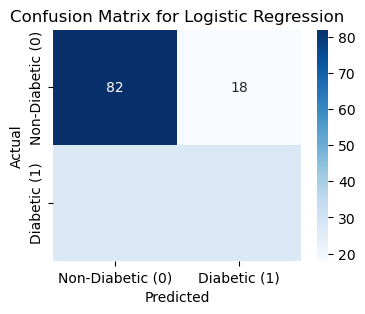

[[82 18]
 [27 27]]


In [560]:
from sklearn.linear_model import LogisticRegression


log_reg = LogisticRegression(random_state=42)                 #model
log_reg.fit(X_train, y_train)

 
y_pred_log_reg = log_reg.predict(X_test)                       #prediction


acc_log_reg = accuracy_score(y_test, y_pred_log_reg)           #metrics
precision = precision_score(y_test, y_pred_log_reg)
recall = recall_score(y_test, y_pred_log_reg)
f1 = f1_score(y_test, y_pred_log_reg)
conf_matrix = confusion_matrix(y_test, y_pred_log_reg)


print("Accuracy for Logistic Regression:", acc_log_reg)
print("Precision for Logistic Regression:", precision)
print("Recall for Logistic Regression:", recall)
print("F1 Score for Logistic Regression:", f1)


plt.figure(figsize=(4, 3))                                       #confusion matrix
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', 
            xticklabels=['Non-Diabetic (0)', 'Diabetic (1)'], 
            yticklabels=['Non-Diabetic (0)', 'Diabetic (1)'])
plt.title('Confusion Matrix for Logistic Regression')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()
print(conf_matrix)

Hyperparameter optimisation with GridSearch

In [562]:

param_grid = {
    'C': [0.001, 0.01, 0.1, 1, 10, 100],             # 1/regularisation strength
    'penalty': ['l1', 'l2', 'elasticnet', 'none'],  # regularisation type
    'solver': ['liblinear', 'saga']                  #solvers
}

# Initialiser GridSearchCV
grid_search = GridSearchCV(estimator=LogisticRegression(max_iter=1000, random_state=42), 
                           param_grid=param_grid, 
                           cv=5, 
                           scoring='accuracy')


grid_search.fit(X_train, y_train)


print("Best parameters:", grid_search.best_params_)
print("Best cross-validation score:", grid_search.best_score_)


best_log_reg = grid_search.best_estimator_
y_pred_log_reg = best_log_reg.predict(X_test)
acc_log_reg = accuracy_score(y_test, y_pred_log_reg)
print("Accuracy for Logistic Regression with best parameters:", acc_log_reg)

Best parameters: {'C': 0.001, 'penalty': 'none', 'solver': 'saga'}
Best cross-validation score: 0.7818072770891644
Accuracy for Logistic Regression with best parameters: 0.7012987012987013


### CONCLUSION ON THE RESULTS

The differents models implemented are showing various results each explicating something about heir performances. The **Random Forest** classifier had the best performance with an accuracy of 76.62%, indicating its strong capability to handle complex interactions within the data. 

In addition, the **MLP Classifier**, trained on a reduced-dimensionallity dataset had an accuracy of 70.7%, that could be explicated by the fact that the reduction may have led to the loss of some information. 

Lastly, the **Logistic Regression** model had a similar accuracy to the MLP but had lower precision and recall, indicating its challenges in identifying diabetic cases.

Overall, the Random Forest model emerged as the most effective, showing its fiability in this classification task.